#  Object Recognition with YOLO

## Object Recognition 

1• Object recognition in image processing refers to the task of identifying and classifying objects within digital images or video frames. 

2• It involves the use of computer vision techniques and machine learning algorithms to automatically detect and recognize objects of interest in visual data.

3. The goal of object recognition is to assign meaningful labels or categories to objects in an image.
   
4. This can involve identifying common objects such as cars, people, animals, or specific object instances such as a particular breed of dog or a specific model of car.

### Object recognition typical steps

1. Preprocessing: This step involves preparing the image data for analysis by performing operations such as resizing, normalizing, or enhancing the image.
2. Feature Extraction: Features that represent discriminative characteristics of objects are extracted from the preprocessed image. These features can be low-level visual descriptors like edges, corners, or textures, or higher-level features learned from deep neural networks.
3. Classification or Detection: The extracted features are used to classify the objects or detect their presence in the image. Classification involves assigning a specific label or category to an entire image, while detection involves localizing and classifying objects within an image.
4. Post-processing: After classification or detection, postprocessing techniques are applied to refine the results, such as filtering out false positives, grouping detections, or estimating object poses and attributes.

## Three computer vision tasks
1. Image Classification: Predict the type or class of an object in an image.
2. Object Localization: Locate the presence of objects in an image and indicate their location with a bounding box.
3. Object Detection: Locate the presence of objects with a bounding box and types or classes of the located objects in an image.

## YOLO - You only look once
1. YOLO does object detection in real-time.
2. It involves a single neural network trained end to end that takes a photograph as input and predicts bounding boxes and class labels for each bounding box directly.  

## YOLO Models 
1. The model works by first splitting the input image into a grid of cells, where each cell is responsible for predicting a bounding box if the center of a bounding box falls within the cell.
2. Each grid cell predicts a bounding box involving the x, y coordinate and the width and height and the confidence.
3. A class prediction is also based on each cell.
4. For example, an image may be divided into a 7×7 grid and each cell in the grid may predict 2 bounding boxes, resulting in 94 proposed bounding box predictions.
5. The class probabilities map and the bounding boxes with confidences are then combined into a final set of bounding boxes and class labels. 

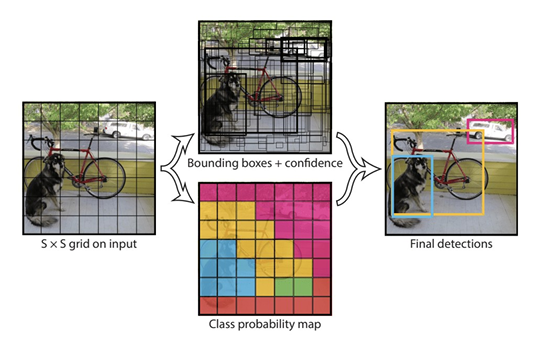

## YOLO: Step by Step

1. Divide the image into a grid of cells.
   – The YOLO algorithm divides the image into a grid of cells, typically 7x7 or 13x13.
    – Each cell is responsible for predicting a set of bounding boxes and class probabilities.
2. Predict bounding boxes and class probabilities for each cell.
   – For each cell, the YOLO algorithm predicts a set of bounding boxes and class probabilities.
   – The bounding boxes are represented as four coordinates: the top left corner, the bottom right corner, and the width and height of the box.
   – The class probabilities represent the probability that the object in the box belongs to a particular class.
3. Apply non-max suppression.
   – The bounding boxes predicted by the YOLO algorithm may overlap.
   – To remove overlapping boxes, the YOLO algorithm applies a non-max suppression algorithm.
   – This algorithm keeps the box with the highest confidence score, and it removes all other boxes that have a high overlap with the selected box.
4. Draw the bounding boxes and class labels on the image.
   – The final step is to draw the bounding boxes and class labels on the image.
   – The bounding boxes are drawn in a different color for each class, and the class labels are displayed next to the bounding boxes.

## YOLO: Summary 
1.  Divide the image into a grid of cells.
2.  Predict bounding boxes and class probabilities for each cell.
3.  Apply non-max suppression.
4.  Draw the bounding boxes and class labels on the image.

### Lets start 

In [ ]:
# Install YOLOv8
!pip install ultralytics -q

In [4]:
import numpy as np
import pandas as pd 
import os
import random
from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
from PIL import Image
random.seed(42)

In [5]:
!yolo -check

Ultralytics 8.3.205 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Setup complete ✅ (4 CPUs, 31.4 GB RAM, 6411.4/8062.4 GB disk)

OS                     Linux-6.6.56+-x86_64-with-glibc2.35
Environment            Colab
Python                 3.11.13
Install                pip
Path                   /usr/local/lib/python3.11/dist-packages/ultralytics
RAM                    31.35 GB
Disk                   6411.4/8062.4 GB
CPU                    Intel Xeon CPU @ 2.00GHz
CPU count              4
GPU                    Tesla P100-PCIE-16GB, 16269MiB
GPU count              1
CUDA                   12.4

numpy                  ✅ 1.26.4>=1.23.0
matplotlib             ✅ 3.7.2>=3.3.0
opencv-python          ✅ 4.11.0.86>=4.6.0
pillow                 ✅ 11.2.1>=7.1.2
pyyaml                 ✅ 6.0.2>=5.3.1
requests               ✅ 2.32.4>=2.23.0
scipy                  ✅ 1.15.3>=1.4.1
torch                  ✅ 2.6.0+cu124>=1.8.0
torch                  ✅ 2.6.0+cu124!=2.4.0,>=1.

In [6]:
# will use multi-class dataset
dataset_dir = "/kaggle/input/object-detection-wildlife-dataset-yolo-format"

# List top-level files/folders
print("Top-level structure:")
print(os.listdir(dataset_dir))

Top-level structure:
['final_data']


In [7]:
print(os.listdir('/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data'))

['valid', 'test', 'data_wl.yaml', 'train']


In [8]:
print(os.listdir('/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/train'))

['labels', 'labels.cache', 'images']


In [9]:
dataset_dir= '/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data'

# Specify the directory containing the train and val images
train_dir = os.path.join(dataset_dir, "train/images")
label_dir_train = os.path.join(dataset_dir, "train/labels")
val_dir = os.path.join(dataset_dir, "valid/images")
label_dir_val = os.path.join(dataset_dir, "valid/labels")

# Get a list of all image files in the train directory
image_files = [f for f in os.listdir(train_dir) if f.endswith((".jpg", ".jpeg"))]

In [10]:
# Count the number of images in each directory
num_train_images = len([f for f in os.listdir(train_dir) if f.endswith((".jpg", ".jpeg"))])
num_val_images = len([f for f in os.listdir(val_dir) if f.endswith((".jpg", ".jpeg"))])

# Calculate the total number of images
total_images = num_train_images + num_val_images

# Calculate the percentage of images in each folder
percentage_train = (num_train_images / total_images) * 100
percentage_val = (num_val_images / total_images) * 100

print(f"Total Number of images {total_images}")
print(f"Percentage of images in the training folder: {percentage_train:.2f}%")
print(f"Percentage of images in the validation folder: {percentage_val:.2f}%")

Total Number of images 1353
Percentage of images in the training folder: 88.91%
Percentage of images in the validation folder: 11.09%


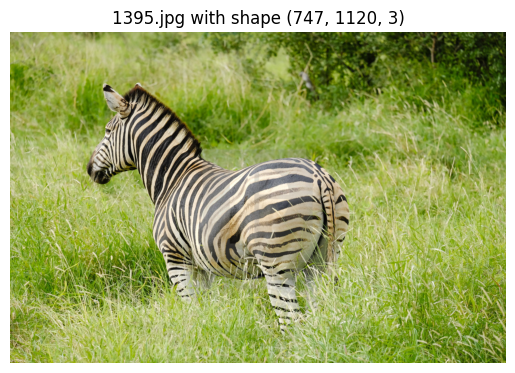

In [12]:
# Randomly select one image to display
random_image = random.choice(image_files)

# Load and display the selected image
image_path = os.path.join(train_dir, random_image)
image = cv2.imread(image_path)  # Read the image using OpenCV
img_shape = image.shape
if image is not None:
    # OpenCV reads images in BGR format, so convert to RGB for Matplotlib
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)) 
    plt.title(f"{random_image} with shape {img_shape}")
    plt.axis('off')
    plt.show()
else:
    print(f"Failed to read {random_image}")

### Checking number of classes

In [14]:
# Get the number of classes 
# Collect class IDs
all_classes = set()

for file in os.listdir(label_dir_train):
    if file.endswith(".txt"):
        with open(os.path.join(label_dir_train, file), "r") as f:
            for line in f:
                if line.strip():  # avoid empty lines
                    class_id = int(line.split()[0])  # first element = class
                    all_classes.add(class_id)

print("Distinct classes found:", sorted(all_classes))
print("Total number of unique classes:", len(all_classes))


Distinct classes found: [0, 1, 2, 3]
Total number of unique classes: 4


### So , we have 4 classes, lets see the images after regular intervals to see these classes

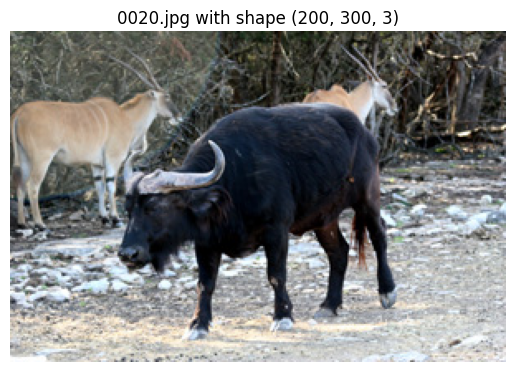

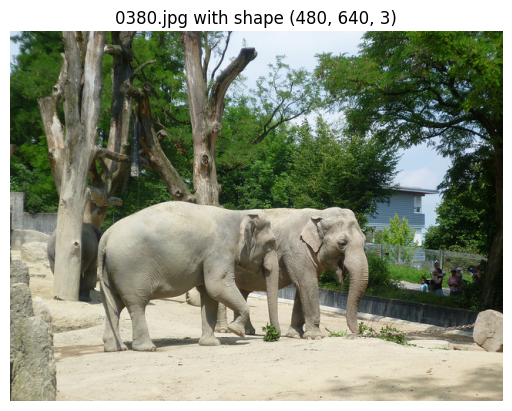

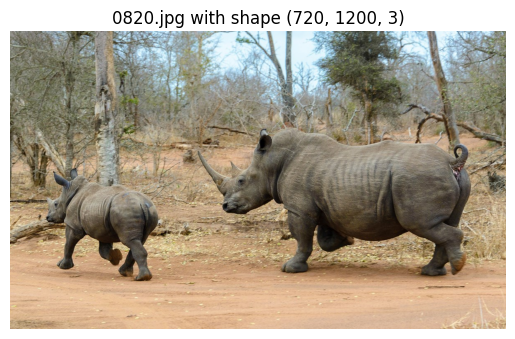

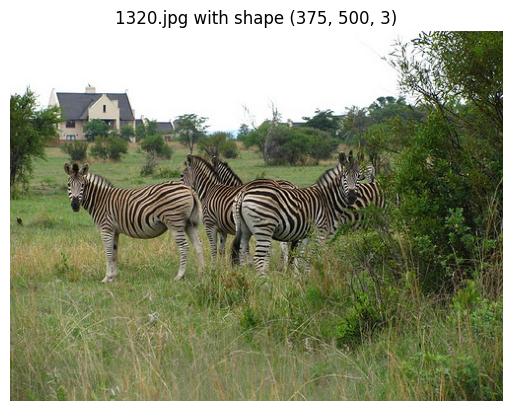

In [15]:
# display images to check the image lables
images = ['0020.jpg', '0380.jpg', '0820.jpg', '1320.jpg']
for image in images:
    image_path = os.path.join(train_dir,image)
    #image_path="/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/train/images/1320.jpg"
    image1 = cv2.imread(image_path)  
    img_shape = image1.shape
    if image is not None:
    # OpenCV reads images in BGR format, so convert to RGB for Matplotlib
        plt.imshow(cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)) 
        plt.title(f"{image} with shape {img_shape}")
        plt.axis('off')
        plt.show()
    else:
        print(f"Failed to read {image}")


### So we have 4 classes
0 : Buffallo
1 : Elephant
2 : Rhino
4 : Zebra

In [16]:
# Checking how labels look like
label_file_path = "/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/train/labels/0401.txt"

# Read the label file into a Pandas DataFrame
column_names = ["class", "x_min", "y_min", "x_max", "y_max"]
df = pd.read_csv(label_file_path, header=None, names=column_names, sep=" ")
df

,class,x_min,y_min,x_max,y_max
0,1,0.485938,0.538732,0.515625,0.678404
1,1,0.310156,0.730047,0.242188,0.291080


Each .txt file in YOLO format corresponds to one image.

Each line inside the file = one object annotation in that image.

That’s why we got 2 rows → it means that image (0401.jpg) has two objects of class 1.

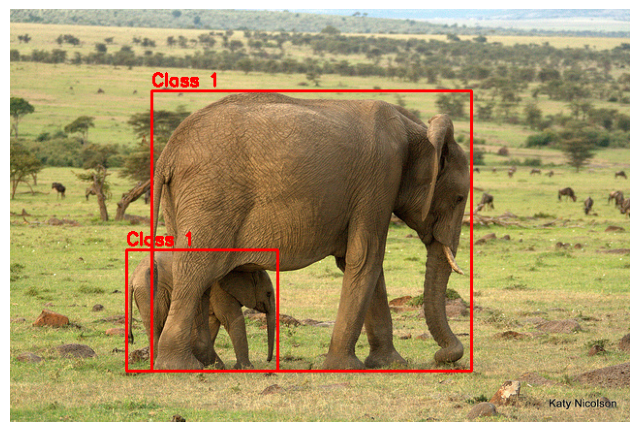

In [18]:
image_filename = "0401.jpg"
image_path = os.path.join(dataset_dir, "train/images", image_filename)
label_file_path = os.path.join(dataset_dir, "train/labels", image_filename.replace(".jpg", ".txt"))

# Load image
image = cv2.imread(image_path)
image_height, image_width, _ = image.shape

# Read YOLO labels
with open(label_file_path, "r") as file:
    yolo_labels = file.readlines()

# Draw bounding boxes
for label in yolo_labels:
    class_id, x_center, y_center, width, height = map(float, label.split())

    # Convert YOLO (relative) → absolute pixel values
    x_center *= image_width
    y_center *= image_height
    width *= image_width
    height *= image_height

    # Bounding box corners
    x1 = int(x_center - width / 2)
    y1 = int(y_center - height / 2)
    x2 = int(x_center + width / 2)
    y2 = int(y_center + height / 2)

    # Draw rectangle + class id
    color = (0, 0, 255)  # red box
    thickness = 2
    cv2.rectangle(image, (x1, y1), (x2, y2), color, thickness)
    cv2.putText(image, f"Class {int(class_id)}", (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)

# Show image
plt.figure(figsize=(8, 8))
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

### We can see that there are 2 eelephants in the image

### For YOLO model training, we have to build a yaml file with train, val datasets info, and number of classes, and class names

In [19]:
#create yaml file for YOLO training

yaml_content = f"""
train: 
  - {train_dir}
  - {label_dir_train}
val: 
  - {val_dir}
  - {label_dir_val}

nc: 4  # number of classes
names: ['Buffalo', 'Elephant', 'Rhino', 'Zebra']  # class names in our dataset as a list
"""

# Write to YAML file
with open("/kaggle/working/wildlife_dataset.yaml", "w") as f:
    f.write(yaml_content)

In [ ]:
# Load a model
model = YOLO('yolov8m.pt') 
# Train the model 
model.train(data='/kaggle/working/wildlife_dataset.yaml', epochs=10, imgsz=640)

Ultralytics 8.3.205 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/wildlife_dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=10, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.

In [23]:
print(os.listdir('/kaggle/working/runs/detect/train2/weights'))

['best.pt', 'last.pt']


In [24]:
# Load your trained model
model = YOLO("/kaggle/working/runs/detect/train2/weights/best.pt")

# Run validation on validation set
metrics = model.val()


Ultralytics 8.3.203 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 92 layers, 25,842,076 parameters, 0 gradients, 78.7 GFLOPs
val: Fast image access ✅ (ping: 0.0±0.0 ms, read: 259.2±111.8 MB/s, size: 152.6 KB)
val: Scanning /kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/valid/labels... 150 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 150/150 1.1Kit/s 0.1s<0.1s
WARNING ⚠️ val: Cache directory /kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 10/10 2.7it/s 3.7s.2ss


/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        150        262      0.925      0.887      0.949      0.795
               Buffalo         38         60      0.907      0.814      0.906      0.742
              Elephant         43         83      0.893      0.904      0.952      0.763
                 Rhino         42         58      0.983      0.977      0.993      0.905
                 Zebra         28         61      0.919      0.852      0.943      0.769
Speed: 2.0ms preprocess, 9.5ms inference, 0.0ms loss, 1.5ms postprocess per image
Results saved to /kaggle/working/runs/detect/val


In [25]:
### YOLOv8 automatically saves all plots in the validation folder:

In [26]:
print(os.listdir('/kaggle/working/runs/detect/val'))

['val_batch1_labels.jpg', 'val_batch2_labels.jpg', 'val_batch1_pred.jpg', 'BoxF1_curve.png', 'BoxP_curve.png', 'val_batch0_pred.jpg', 'confusion_matrix_normalized.png', 'BoxR_curve.png', 'BoxPR_curve.png', 'val_batch0_labels.jpg', 'confusion_matrix.png', 'val_batch2_pred.jpg']


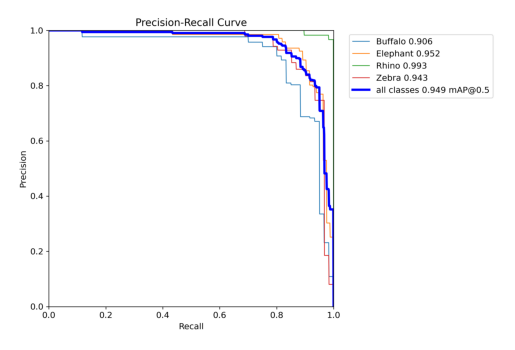

In [27]:
# Display Precision-Recall curve
pr_curve = cv2.imread("/kaggle/working/runs/detect/val/BoxPR_curve.png")
plt.imshow(cv2.cvtColor(pr_curve, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

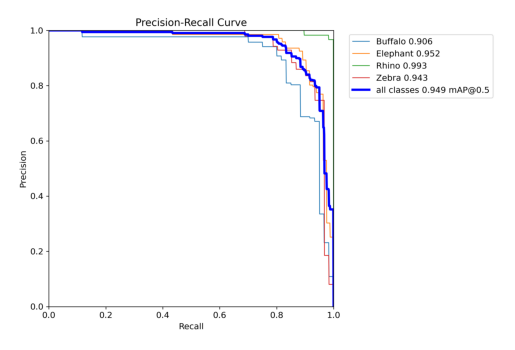

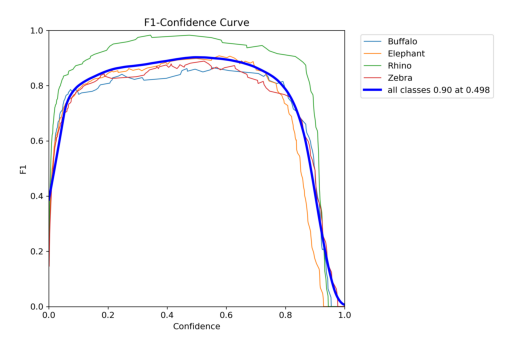

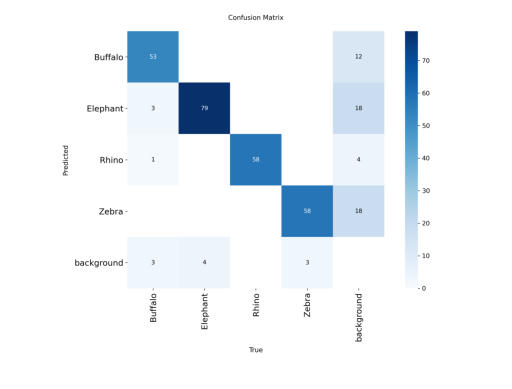

In [28]:
import matplotlib.pyplot as plt
import cv2

# Display Precision-Recall curve
pr_curve = cv2.imread("/kaggle/working/runs/detect/val/BoxPR_curve.png")
plt.imshow(cv2.cvtColor(pr_curve, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

# Display F1 curve
f1_curve = cv2.imread("/kaggle/working/runs/detect/val/BoxF1_curve.png")
plt.imshow(cv2.cvtColor(f1_curve, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()

cm_curve = cv2.imread("/kaggle/working/runs/detect/val/confusion_matrix.png")
plt.imshow(cv2.cvtColor(cm_curve, cv2.COLOR_BGR2RGB))
plt.axis("off")
plt.show()


0: 448x640 1 Buffalo, 13.7ms
Speed: 2.9ms preprocess, 13.7ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


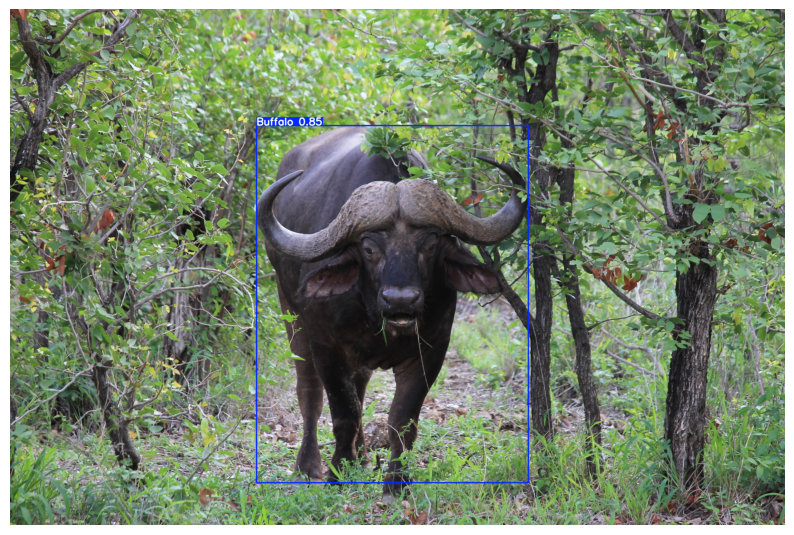

In [34]:
### Lets check the model to detect and classify an onbject in an image
# Load model
model = YOLO("/kaggle/working/runs/detect/train2/weights/best.pt")

# Load image
img = cv2.imread('/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/valid/images/0365.jpg')

# Run prediction
prediction = model.predict(img)[0]

# Draw bounding boxes on the image
pred_img = prediction.plot(line_width=4, font_size=12)

# Convert BGR (OpenCV) → RGB (for matplotlib / PIL)
pred_img = pred_img[:, :, ::-1]

# Display with matplotlib
plt.figure(figsize=(10, 10))
plt.imshow(pred_img)
plt.axis("off")
plt.show()


0: 480x640 1 Buffalo, 14.6ms
Speed: 2.1ms preprocess, 14.6ms inference, 1.3ms postprocess per image at shape (1, 3, 480, 640)

0: 640x448 1 Elephant, 14.0ms
Speed: 2.9ms preprocess, 14.0ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 448)

0: 640x448 2 Elephants, 13.1ms
Speed: 1.6ms preprocess, 13.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 448)

0: 480x640 1 Buffalo, 14.6ms
Speed: 1.5ms preprocess, 14.6ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 640x640 1 Elephant, 16.9ms
Speed: 1.7ms preprocess, 16.9ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 448x640 2 Buffalos, 13.4ms
Speed: 1.7ms preprocess, 13.4ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 Elephant, 12.9ms
Speed: 2.1ms preprocess, 12.9ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 480x640 1 Rhino, 14.7ms
Speed: 2.0ms preprocess, 14.7ms inference, 1.2ms postprocess per image at sha

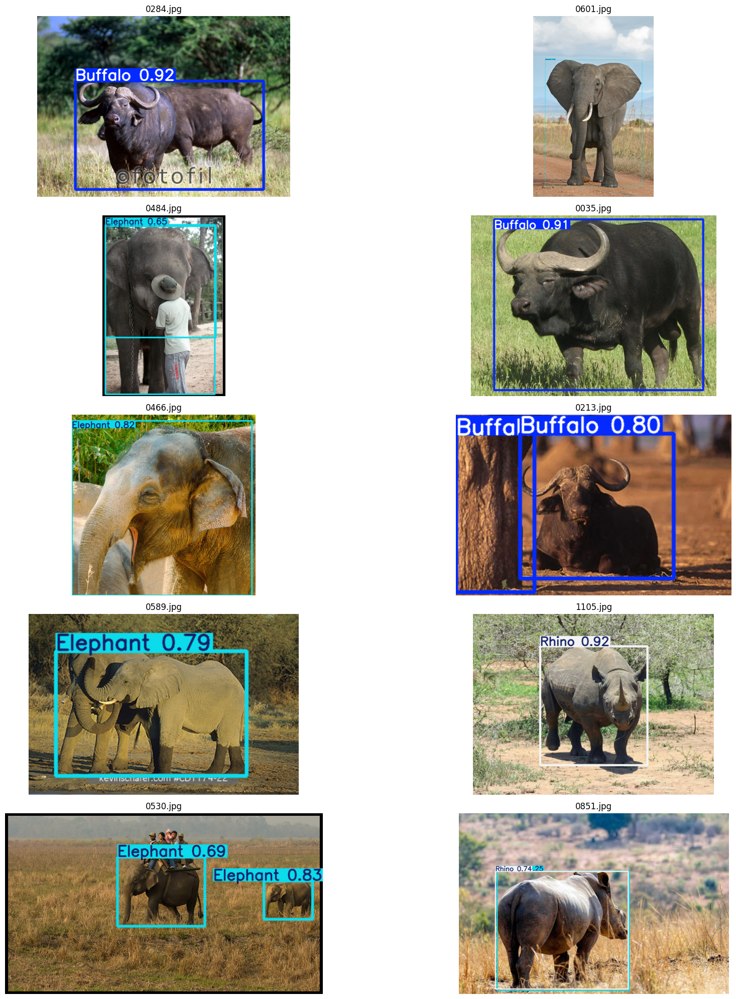

In [36]:
# prediction on 10 random images from val folder
# Load model
model = YOLO("/kaggle/working/runs/detect/train2/weights/best.pt")

# Path to validation images
val_dir = "/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/valid/images"

# Get list of images
all_images = [os.path.join(val_dir, img) for img in os.listdir(val_dir) if img.endswith((".jpg", ".png", ".jpeg"))]

# Randomly pick 10 images
sampled_images = random.sample(all_images, 10)

# Run inference and display
plt.figure(figsize=(20, 20))

for i, img_path in enumerate(sampled_images):
    # Load image
    img = cv2.imread(img_path)

    # Run prediction
    prediction = model.predict(img)[0]

    # Draw bounding boxes
    pred_img = prediction.plot(line_width=3, font_size=12)

    # Convert BGR to RGB
    pred_img = pred_img[:, :, ::-1]

    # Show
    plt.subplot(5, 2, i+1)  # 5 rows, 2 columns
    plt.imshow(pred_img)
    plt.title(os.path.basename(img_path))
    plt.axis("off")

plt.tight_layout()
plt.show()



0: 448x640 1 cow, 1 elephant, 13.5ms
Speed: 2.0ms preprocess, 13.5ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 7 zebras, 12.9ms
Speed: 1.5ms preprocess, 12.9ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

0: 448x640 1 cow, 12.9ms
Speed: 2.4ms preprocess, 12.9ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 1 elephant, 14.0ms
Speed: 1.9ms preprocess, 14.0ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)

0: 448x640 3 cows, 13.5ms
Speed: 2.2ms preprocess, 13.5ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 640x640 2 cows, 17.1ms
Speed: 2.5ms preprocess, 17.1ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 448x640 1 cow, 1 elephant, 13.7ms
Speed: 1.8ms preprocess, 13.7ms inference, 1.2ms postprocess per image at shape (1, 3, 448, 640)

0: 384x640 1 cow, 14.0ms
Speed: 2.0ms preprocess, 14.0ms inference, 1.2ms postprocess per image at shape

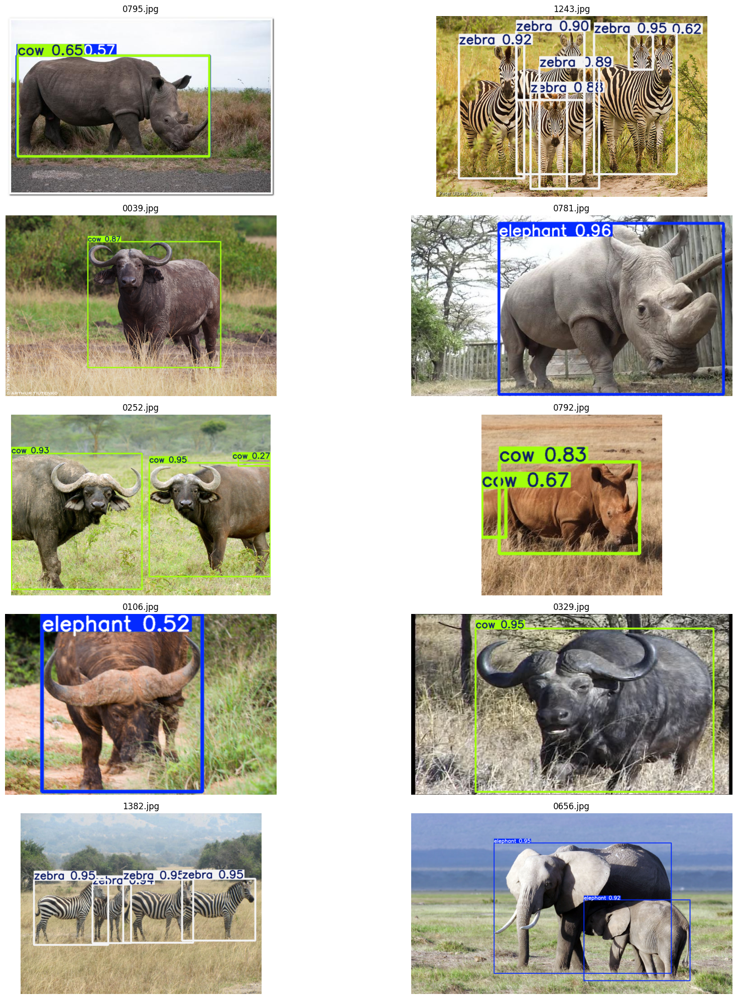

In [37]:
### predicting with base model
# prediction on 10 random images from val folder
# Load base model
model = YOLO('yolov8m.pt') 

# Path to validation images
val_dir = "/kaggle/input/object-detection-wildlife-dataset-yolo-format/final_data/valid/images"

# Get list of images
all_images = [os.path.join(val_dir, img) for img in os.listdir(val_dir) if img.endswith((".jpg", ".png", ".jpeg"))]

# Randomly pick 10 images
sampled_images = random.sample(all_images, 10)

# Run inference and display
plt.figure(figsize=(20, 20))

for i, img_path in enumerate(sampled_images):
    # Load image
    img = cv2.imread(img_path)

    # Run prediction
    prediction = model.predict(img)[0]

    # Draw bounding boxes
    pred_img = prediction.plot(line_width=3, font_size=12)

    # Convert BGR to RGB
    pred_img = pred_img[:, :, ::-1]

    # Show
    plt.subplot(5, 2, i+1)  # 5 rows, 2 columns
    plt.imshow(pred_img)
    plt.title(os.path.basename(img_path))
    plt.axis("off")

plt.tight_layout()
plt.show()

### We can see that the trained model performnace is better than the base model


0: 640x640 1 Elephant, 1 Zebra, 16.1ms
Speed: 3.5ms preprocess, 16.1ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)
Detected Zebra with confidence 0.91
Detected Elephant with confidence 0.90


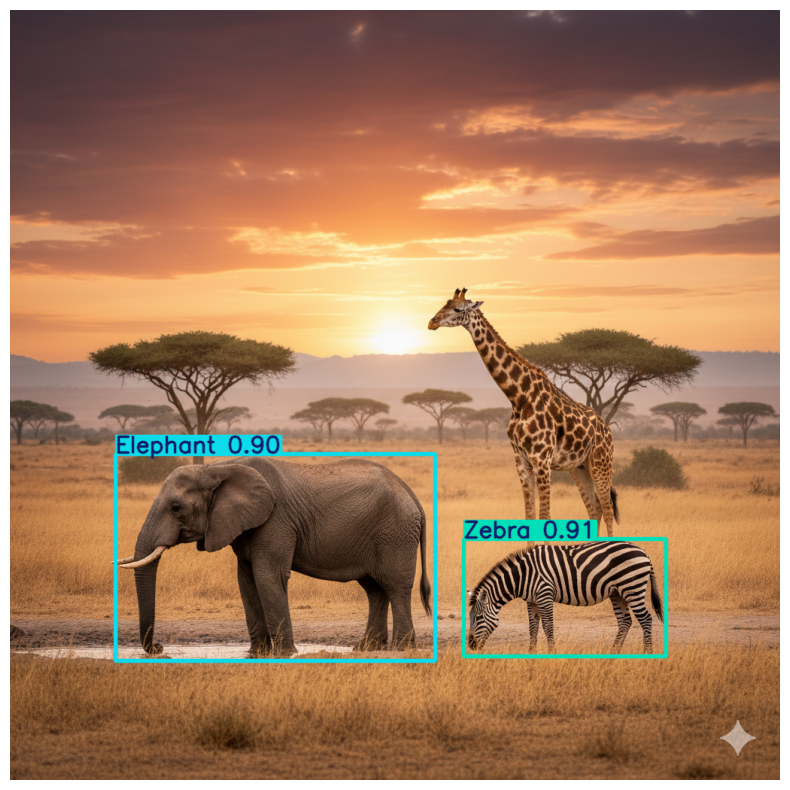

In [39]:
#testing the model on a new image
# Load trained model
model = YOLO("/kaggle/working/runs/detect/train/weights/best.pt")

# Load a test image (with elephant, giraffe, zebra)
img_path = "/kaggle/input/test-image/Yolo_image.png"
img = cv2.imread(img_path)

# Run prediction
results = model.predict(img)[0]

# Print detected objects
for box in results.boxes:
    cls_id = int(box.cls)
    class_name = results.names[cls_id]
    conf = float(box.conf)
    print(f"Detected {class_name} with confidence {conf:.2f}")

# Draw bounding boxes
pred_img = results.plot(line_width=3, font_size=0.8)
pred_img = pred_img[:, :, ::-1]  # BGR → RGB

# Display
plt.figure(figsize=(10, 10))
plt.imshow(pred_img)
plt.axis("off")
plt.show()
